# Tutorial: Visualizing your results
In this tutorial, we will be exploring different forms of visualization in Python using various packages. We will start by learning how to use **Matplotlib**, a popular plotting library in Python. We will then move on to **Seaborn**, which provides more advanced statistical visualizations. Next, we will explore **Plotly**, a powerful tool for creating interactive plots. Finally, we will introduce **Folium**, a library for creating geospatial visualizations.

Throughout this tutorial, we will cover different types of visualizations, including spatial and non-spatial, single and multi-panel, static and interactive plots. We will also explore the use of different colormaps to enhance our visualizations.

By the end of this tutorial, you will have a solid understanding of different visualization techniques and be able to create a wide range of visualizations to communicate your data effectively

<div class="alert alert-block alert-danger">
<b>Important:</b> This tutorial is not part of your final grade. And also no assignment is attached to this tutorial. You can just enjoy and explore some of the possibilities of visualizing data. 
</div>

### Important before we start
---
Make sure that you save this file before you continue, else you will lose everything. To do so, go to **Bestand/File** and click on **Een kopie opslaan in Drive/Save a Copy on Drive**!

Now, rename the file into Week7_Tutorial1.ipynb. You can do so by clicking on the name in the top of this screen.

## Learning Objectives
<hr>

- Know which packages are available in Python to visualize your data.
- Gain a basic understanding of plotting static figures, both spatial and non-spatial.
- Understand the impact of scaling and color choices.
- Know how to create a basic interactive visualisation with Plotly or Folium.

<h2>Tutorial Outline<span class="tocSkip"></span></h2>
<hr>
<div class="toc"><ul class="toc-item">
<li><span><a href="#1.-Introducing the packages" data-toc-modified-id="1.-Introducing-the-packages-2"> 1. Introducing the packages</a></span></li>   
<li><span><a href="#2.-Better understanding Matplotlib" data-toc-modified-id="1.-Better-understanding-Matplotlib-2"> 2. Better understanding Matplotlib</a></span></li>
<li><span><a href="#3.-Creating static non-spatial plots" data-toc-modified-id="2.-Extracting-landuse-information-3">3. Creating static non-spatial plots</a></span></li>
<li><span><a href="#4.-Creating static spatial plots-" data-toc-modified-id="3.-Visualize-Rasterize-4">4. Creating static spatial plots</a></span></li>
<li><span><a href="#5.-Using Plotly for interactive visualization" data-toc-modified-id="4.-Extracting-buildings-5">5. Using Plotly for interactive visualization</a></span></li>
<li><span><a href="#6.-Using Folium for interactive spatial visualization" data-toc-modified-id="5.-Plot-routes-6">6. Using Folium for interactive spatial visualization</a></span></li></ul></div>

## 1.Introducing the packages
<hr>

Within this tutorial, we are going to make use of the following packages: 

[**GeoPandas**](https://geopandas.org/) is a Python package that extends the datatypes used by pandas to allow spatial operations on geometric types.

[**NumPy**](https://numpy.org/doc/stable/) is a Python library that provides a multidimensional array object, various derived objects, and an assortment of routines for fast operations on arrays.

[**Pandas**](https://pandas.pydata.org/docs/) is an open source, BSD-licensed library providing high-performance, easy-to-use data structures and data analysis tools for the Python programming language.

[**Matplotlib**](https://matplotlib.org/) is a comprehensive Python package for creating static, animated, and interactive visualizations in Python. Matplotlib makes easy things easy and hard things possible.

[**seaborn**](https://seaborn.pydata.org/index.html) is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

[**Plotly**](https://plotly.com/python/) is a Python data visualization library that supports over 40 unique chart types covering a wide range of statistical, financial, geographic, scientific, and 3-dimensional use-cases. It is built on top of the Plotly JavaScript library (plotly.js), and enables Python users to create  interactive web-based visualizations that can be displayed in Jupyter notebooks, or saved to standalone HTML files. The plotly Python library is sometimes referred to as "plotly.py" to differentiate it from the JavaScript library.

[**folium**](https://python-visualization.github.io/folium/#) is a Python package to visualize data on an interactive map. It enables both the binding of data to a map for choropleth visualizations as well as passing rich vector/raster/HTML visualizations as markers on the map. It is build on top of the leaflet.js library.

*We will first need to install these packages in the cell below. Uncomment them to make sure we can pip install them*

In [1]:
!pip install geopandas
!pip install rasterio
!pip install plotly
!pip install folium
!pip install branca
!pip install mapclassify 

Now we will import these packages in the cell below:

In [5]:
import pandas as pd
import seaborn as sns
import numpy as np
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
import folium
import branca.colormap as cm
import plotly.io as pio
import plotly.express as px
import plotly.offline as py

from urllib.request import urlopen
from zipfile import ZipFile
from io import BytesIO

### Import the data

In [7]:
## this is the link to the 1/100 flood map for Europe
zipurl = 'https://github.com/ElcoK/BigData_AED/raw/main/week7/Data_Week7.zip'

# and now we open and extract the data
with urlopen(zipurl) as zipresp:
    with ZipFile(BytesIO(zipresp.read())) as zfile:
        zfile.extractall()

## 2. Better understanding matplotlib
<hr>

As you have already been made aware, Matplotlib is a popular data visualization library in Python that enables you to create various types of plots such as line plots, scatter plots, histograms, bar plots, etc. It is widely used in scientific computing, data analysis, and machine learning (and within our course). It is, however, not a very friendly and intuitive package to use. Let's distentangle some of the steps that we can take to create a simple plot.

First we create a DataFrame with some sample data:

In [3]:
data = {'x': [1, 2, 3, 4, 5], 'y1': [2, 6, 12, 20, 30], 'y2': [1, 4, 9, 16, 25]}
df = pd.DataFrame(data)

To create a line plot with two lines, we can use the code in the cell below. The first argument of the function is the x-axis values, and the second argument is the y-axis values. We have also added labels to each line using the `label` argument.

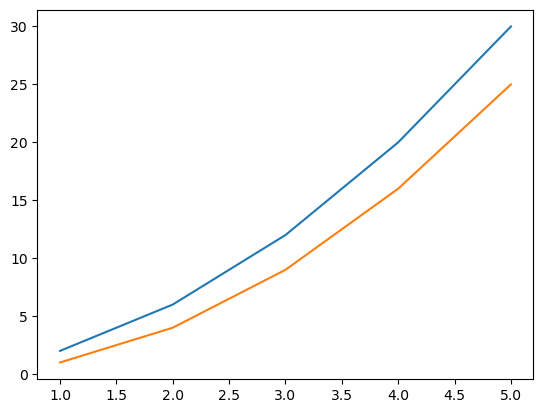

In [4]:
plt.plot(df['x'], df['y1'], label='Line 1')
plt.plot(df['x'], df['y2'], label='Line 2')

While this provides us with a basic plot, it does not contain any information about what we see. We need units, a title, a legend. So let's add all these things. Here, we use the `plt.legend()` function to add a legend to the plot. This function will automatically use the labels we defined earlier for each line. To add labels to the x and y axes, we can use the `plt.xlabel()` and `plt.ylabel()` functions. 

Moreover, we often want to add some specific font characteristics to our labels. Such as the fontsize or the to make it **bold**. We do so in the `plt.title()` function with the `fontweight` and `fontsize` arguments. 

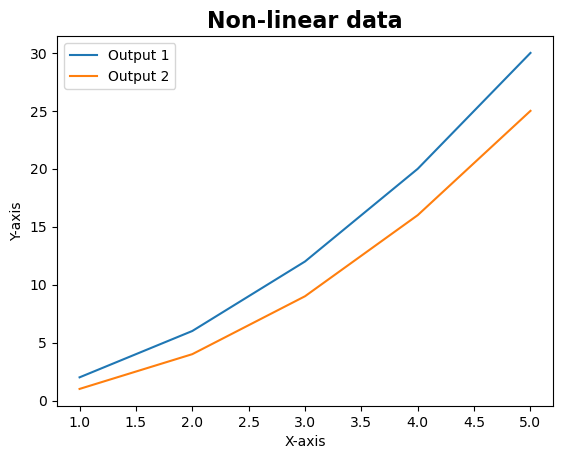

In [5]:
plt.plot(df['x'], df['y1'], label='Output 1')
plt.plot(df['x'], df['y2'], label='Output 2')

plt.legend()
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Non-linear data', fontweight='bold', fontsize=16)

plt.show()

Sometimes we want to make some changes to the way the x and y-axis ticks (the numbers) are represented. Maybe you want to add more ticks, or maybe less. Luckily we can specify this through the use of the `plt.yticks()` to change the ticks on the y-axis or `plt.xticks()` to change the ticks on the x-axis. Let's change some of the ticks on the y-axis! 

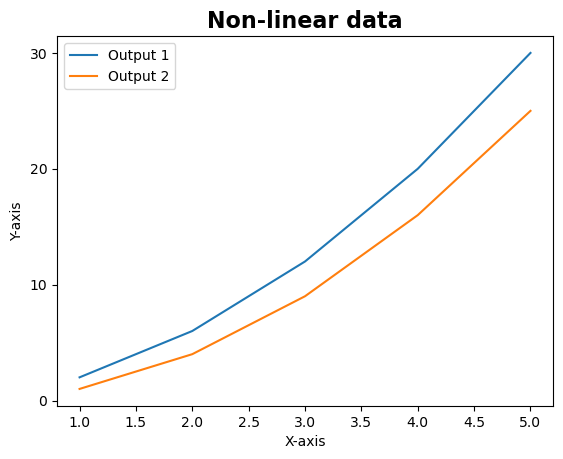

In [6]:
plt.plot(df['x'], df['y1'], label='Output 1')
plt.plot(df['x'], df['y2'], label='Output 2')

plt.legend()
plt.yticks([0, 10, 20, 30])
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Non-linear data', fontweight='bold', fontsize=16)

plt.show()

And this is just a tiny start of all the things you can do with matplotlib. Feel free to explore many of other options on their (improved) [website](https://matplotlib.org/stable/plot_types/index.html).

## 3. Creating static non-spatial plots
<hr>

We will use the [Natural Earth](https://www.naturalearthdata.com/) data as a starting point for some visualization. Natural Earth is a public domain map dataset that provides geographic data at various scales, including world, regional, and country-level detail. The dataset is designed for use in cartography, GIS, and other mapping applications, and includes a wide range of physical and cultural features such as land cover, water bodies, cities, transportation networks, and more.

The Natural Earth dataset is created and maintained by a community of volunteers, who work to ensure that the data is accurate, up-to-date, and free from copyright restrictions. The dataset is available in a variety of formats, including shapefiles, GeoJSON, and raster tiles, and can be easily integrated into mapping applications and analysis tools.

Natural Earth data is useful for a wide range of applications, including environmental monitoring, urban planning, disaster response, and tourism. It provides a consistent and reliable source of geographic information that can be used to create high-quality maps and visualizations.

In [9]:
global_data = gpd.read_file('ne_10m_admin_0_countries.shp')

In [10]:
global_data.GDP_MD.sort_values()

167         -99
257           0
204           0
174           0
173           0
         ...   
8       2868929
49      3861123
189     5081769
9      14342903
154    21433226
Name: GDP_MD, Length: 258, dtype: int64

### Single plot

We will start by exploring the relation between *POP_EST* (Population Estimates) and *GDP_MD* (Gross Domestic Product (GDP) at market prices in millions of US dollars). We will first make a simple scatter plot, which is a common way to look for a potential correlation.

Text(0.5, 1.05, 'Country-level comparison between Population and GDP')

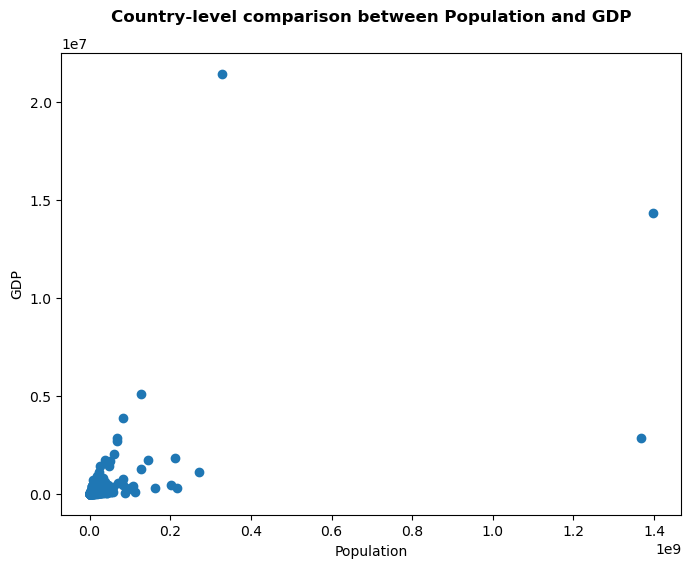

In [11]:
fig,ax = plt.subplots(figsize=(8,6))

ax.scatter(x=global_data.POP_EST,y=global_data.GDP_MD)
ax.set_xlabel('Population')
ax.set_ylabel('GDP')

ax.set_title('Country-level comparison between Population and GDP', fontweight='bold', fontsize=12, y=1.05)


That plot doesnt show much yet. We have a few very large countries (either in population, or in GDP). All the other countries are clustered together. Maybe we can already see a bit more when we use log-scales.

Text(0.5, 1.05, 'Country-level comparison between Population and GDP')

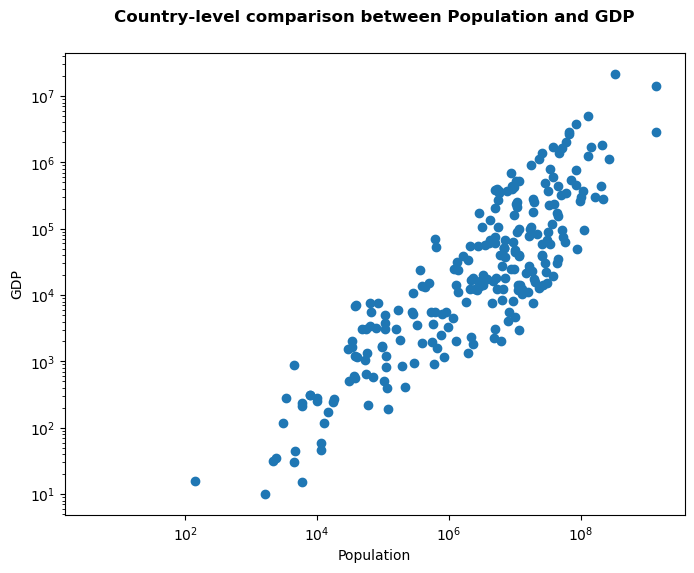

In [12]:
fig,ax = plt.subplots(figsize=(8,6))

ax.scatter(x=global_data.POP_EST,y=global_data.GDP_MD)
ax.set_xlabel('Population')
ax.set_ylabel('GDP')
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_title('Country-level comparison between Population and GDP', fontweight='bold', fontsize=12, y=1.05)

Much better. However, it does not say much more than just the relation between GDP and Population. It would be interesting, for example, to add some more info about the different points.

While we can use matplotlib again, a more convenient package to use is the [seaborn package](https://seaborn.pydata.org/). Seaborn, which is built on top of Matplotlib and provides a higher-level interface for creating statistical graphics. Seaborn simplifies many of the complexities of Matplotlib and provides a wide range of visualizations for exploring relationships between variables. By learning how to use Seaborn, you will be able to create more advanced and sophisticated visualizations in a shorter amount of time.

One way to include the amount of data per location in the plot is to change the size of the dot. We do this through using the `size` option. Let's compute the size of the country to use that to change the size of the dots. We do that through the `area` function within **GeoPandas**.

In [13]:
global_data['Country_Size'] = np.log(global_data.to_crs(3857).area)

Text(0.5, 1.05, 'Country-level comparison between Population and GDP')

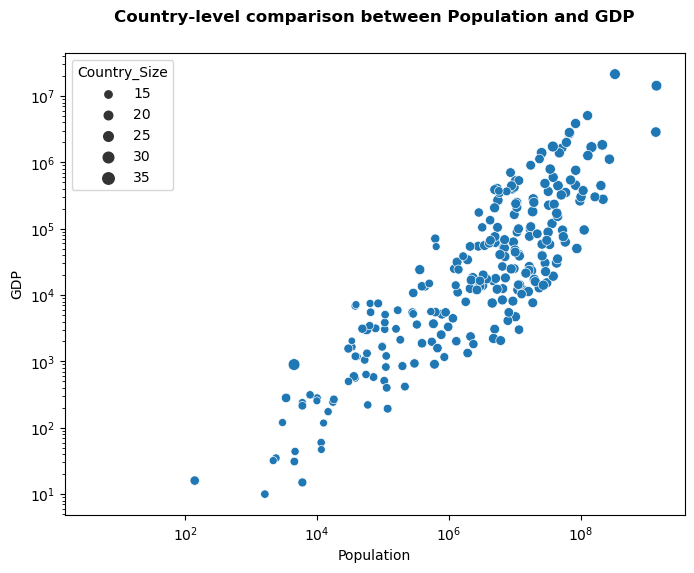

In [14]:
fig,ax = plt.subplots(figsize=(8,6))

ax = sns.scatterplot(x="POP_EST", y="GDP_MD", size="Country_Size", 
                data=global_data)
ax.set_xlabel('Population')
ax.set_ylabel('GDP')
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_title('Country-level comparison between Population and GDP', fontweight='bold', fontsize=12, y=1.05)

Hmm that does not work great yet. Another option would be to change the color! Through *seaborn*, we do this by specifying which column should be coloured through the `hue` argument.

Text(0.5, 1.05, 'Country-level comparison between Population and GDP')

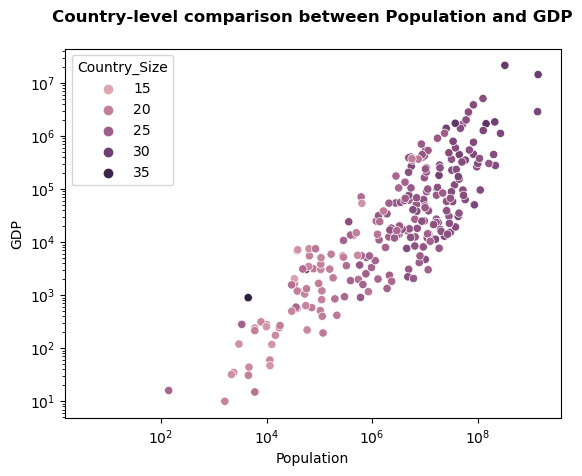

In [210]:
fig,ax = plt.subplots()

ax = sns.scatterplot(x="POP_EST", y="GDP_MD", hue="Country_Size", 
                data=global_data)
ax.set_xlabel('Population')
ax.set_ylabel('GDP')
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_title('Country-level comparison between Population and GDP', fontweight='bold', fontsize=12, y=1.05)

### Colormaps

Let's stop for a moment here and let's take some time to explore colormaps a little bit more. Choosing the right colormap is a critical aspect of creating effective visualizations. A colormap is a mapping between a range of values and a set of colors, and it determines how the data is represented in the visualization. Selecting the appropriate colormap can help communicate the data accurately and highlight important features, while choosing the wrong colormap can obscure or even misrepresent the data.

Different colormaps are appropriate for different types of data and different visualization goals. For example, *sequential* colormaps are useful for showing variations in magnitude, while *diverging* colormaps are appropriate for highlighting differences between two groups of values. Selecting the appropriate colormap can enhance the clarity and interpretability of your visualizations, while choosing an inappropriate one can lead to misinterpretation or confusion.

And the amount of colors, and colormaps is endless! Let's have a look below which colormaps are available in matplotlib through the `plt.colormaps()` function.

In [12]:
plt.colormaps()

['magma',
 'inferno',
 'plasma',
 'viridis',
 'cividis',
 'twilight',
 'twilight_shifted',
 'turbo',
 'Blues',
 'BrBG',
 'BuGn',
 'BuPu',
 'CMRmap',
 'GnBu',
 'Greens',
 'Greys',
 'OrRd',
 'Oranges',
 'PRGn',
 'PiYG',
 'PuBu',
 'PuBuGn',
 'PuOr',
 'PuRd',
 'Purples',
 'RdBu',
 'RdGy',
 'RdPu',
 'RdYlBu',
 'RdYlGn',
 'Reds',
 'Spectral',
 'Wistia',
 'YlGn',
 'YlGnBu',
 'YlOrBr',
 'YlOrRd',
 'afmhot',
 'autumn',
 'binary',
 'bone',
 'brg',
 'bwr',
 'cool',
 'coolwarm',
 'copper',
 'cubehelix',
 'flag',
 'gist_earth',
 'gist_gray',
 'gist_heat',
 'gist_ncar',
 'gist_rainbow',
 'gist_stern',
 'gist_yarg',
 'gnuplot',
 'gnuplot2',
 'gray',
 'hot',
 'hsv',
 'jet',
 'nipy_spectral',
 'ocean',
 'pink',
 'prism',
 'rainbow',
 'seismic',
 'spring',
 'summer',
 'terrain',
 'winter',
 'Accent',
 'Dark2',
 'Paired',
 'Pastel1',
 'Pastel2',
 'Set1',
 'Set2',
 'Set3',
 'tab10',
 'tab20',
 'tab20b',
 'tab20c',
 'magma_r',
 'inferno_r',
 'plasma_r',
 'viridis_r',
 'cividis_r',
 'twilight_r',
 'twilight

Ok, so that is indeed a massive list. But we can also conveniently explore them. Just change the number in the cell below:

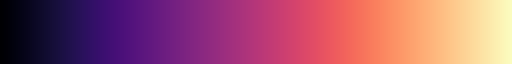

In [13]:
cmaps = plt.colormaps()
plt.get_cmap(cmaps[0])

we generally abbreviate colormap as `cmap`. This is also the argument we generally use to specify which colormap we want to use. Seaborn, however, generally uses the term `palette`. We can add any colormap through the `palette` argument to our plot. It will change which colormap will be used to represent the `hue`. If you try different colormaps, you will already discover that some colormaps work, and others don't work at all!

Text(0.5, 1.05, 'Country-level comparison between Population and GDP')

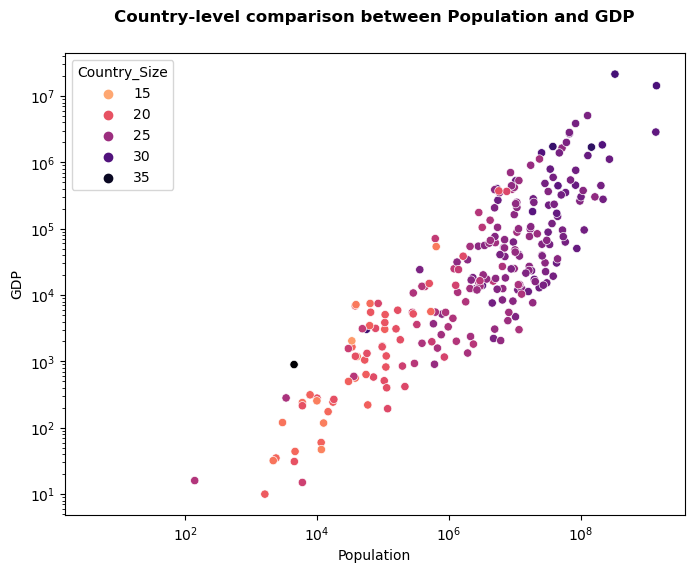

In [15]:
fig,ax = plt.subplots(figsize=(8,6))

ax = sns.scatterplot(x="POP_EST", y="GDP_MD", hue="Country_Size", palette='magma_r',
                data=global_data)
ax.set_xlabel('Population')
ax.set_ylabel('GDP')
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_title('Country-level comparison between Population and GDP', fontweight='bold', fontsize=12, y=1.05)

We can generally distinguish three types of colormaps: 

- **diverging** 
- **sequential** 
- **qualitative**

The [Colorbrewer website](https://colorbrewer2.org/) can be very helpful to play around with different color schemes. But let's explore the three different types first. We start with **diverging** colormaps. They generally use *three* colors. The third colour is generally located in the middle. We can have a look at some **diverging** colormaps below:

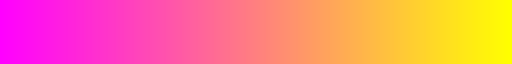

In [15]:
plt.get_cmap('spring')

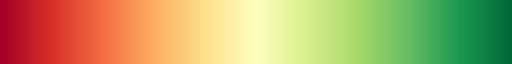

In [16]:
plt.get_cmap('RdYlGn')

The second type are the **sequential** colormaps. They generally use *one* color, and move from white to the "purest form" of that color. We can have a look at some **sequential** colormaps below:

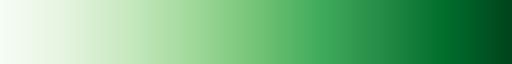

In [17]:
plt.get_cmap('Greens')

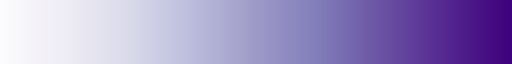

In [18]:
plt.get_cmap('Purples')

The third type are the **qualitative** colormaps. They use unique colors for each category we want to plot. We can have a look at some **qualitative** colormaps below:

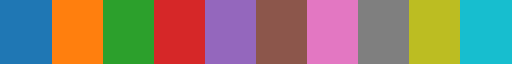

In [19]:
plt.get_cmap('tab10')

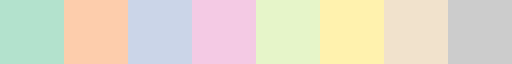

In [20]:
plt.get_cmap('Pastel2')

### Multi-panel figures

Multi-panel plots, also known as small multiples, are a powerful tool for visualizing big data. As the name suggests, multi-panel plots display multiple panels, each containing a subset of the data, side-by-side or stacked vertically. This approach allows you to compare and contrast different aspects of the data, identify patterns and trends, and explore relationships between variables.

Visualizing big data can be challenging, especially when the data is complex or contains many variables. Multi-panel plots can help overcome this challenge by allowing you to break down the data into smaller, more manageable subsets. By visualizing these subsets side-by-side or stacked vertically, you can quickly identify patterns and trends that might not be apparent when looking at the data as a whole.

Multi-panel plots are also useful when exploring relationships between variables. By displaying multiple panels with different combinations of variables, you can quickly identify correlations and relationships between different aspects of the data. This can help you develop a deeper understanding of the data and uncover insights that might not be apparent when looking at the data as a whole.

Let's continue with our global data. One simple way to create multi-panel figures is to, for example, create a panel for each continent. Ofcourse we can manually split our data, but one convenient way would be to loop over the differen continents. Remember the `groupby` function? We can also use that too loop over subsets within our data!

In [227]:
for continent in global_data.groupby('CONTINENT'):
    continent

The `continent` object is a tuple that contains the name of the continent as the first element and the dataframe with all the countries within that continent in the other element:

In [283]:
continent

('South America',
           featurecla  scalerank  LABELRANK                     SOVEREIGNT  \
 2    Admin-0 country          0          2                          Chile   
 3    Admin-0 country          0          3                        Bolivia   
 4    Admin-0 country          0          2                           Peru   
 5    Admin-0 country          0          2                      Argentina   
 22   Admin-0 country          0          4                       Suriname   
 23   Admin-0 country          0          4                         Guyana   
 44   Admin-0 country          0          2                         Brazil   
 45   Admin-0 country          0          4                        Uruguay   
 136  Admin-0 country          0          3                        Ecuador   
 137  Admin-0 country          0          2                       Colombia   
 138  Admin-0 country          0          4                       Paraguay   
 139  Admin-0 country          0          9   

The code below is creating a scatter plot of population versus GDP for different continents using the **seaborn** library for data visualization. The plot is divided into 2 rows and 3 columns using the `subplots()` function. The size of the plot is defined as `12 by 6` inches.

Then, the code loops through each continent's data grouped by the `'CONTINENT'` column in a pandas DataFrame named `'global_data'`. The loop skips the `'Antarctica'` and `'Seven seas (open ocean)'` continents using a `continue` statement.

For each continent, the code defines a new variable `continent_data` containing the data for that continent. The plot axes are defined using the `scatterplot()` function from seaborn for each subplot. The plot markers are colored by `'Country_Size'` column using the `'magma_r'` color palette. The subplot axes are retrieved using the `flatten()` method of the axes object, and the legend is turned off.

The code then sets the axis labels, scaling to logarithmic for both `x` and `y-axes`, and sets the subplot title to the name of the continent. 

Finally, the code adjusts the subplot spacing using the `subplots_adjust()` function from matplotlib.

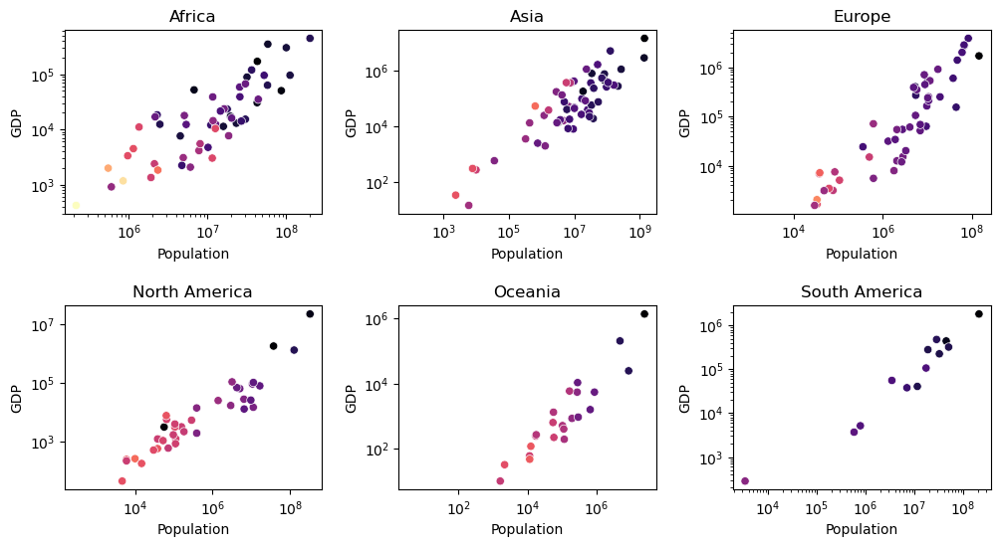

In [266]:
fig, axes = plt.subplots(2,3,figsize=(12,6))

iter_ = 0
for continent in global_data.groupby('CONTINENT'):
    continent
    
    if continent[0] in ['Antarctica','Seven seas (open ocean)']:
        continue
    
    continent_data = continent[1]
    
    ax = sns.scatterplot(x="POP_EST", y="GDP_MD", hue="Country_Size", palette='magma_r',
                data=continent_data,ax=axes.flatten()[iter_], legend=False)
    ax.set_xlabel('Population')
    ax.set_ylabel('GDP')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title(continent[0])
        
    iter_ += 1
    
plt.subplots_adjust(hspace=0.5, wspace=0.3)
    

This is nice, but let's improve the plot to make it a bit more friendly to read. We could, for example, give it shared axis, using the `sharex` and `sharey` parameters in the `plt.subplots()` function. And we also want a legend! But not six. So let's add a legend to one of the outermost figures.

We have to make sure that the legend is plotted outside the figure, so we use `bbox_to_anchor` argument to make sure we can locate it outside the plot, and we add a title so people understand what we are looking at.

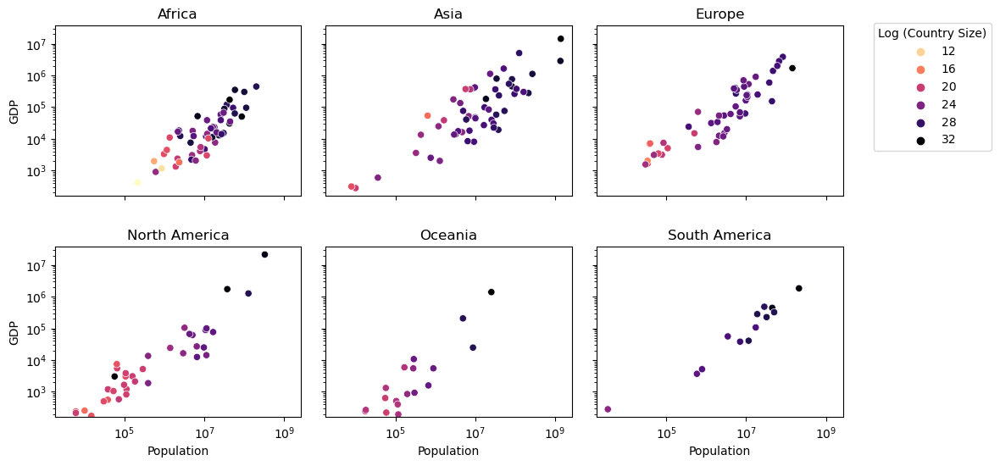

In [284]:
fig, axes = plt.subplots(2, 3,figsize=(12,6),sharex=True,sharey=True)

iter_ = 0
for continent in global_data.groupby('CONTINENT'):
    continent
    
    if continent[0] in ['Antarctica','Seven seas (open ocean)']:
        continue
    
    continent_data = continent[1]
    
    if iter_ != 2: 
        ax = sns.scatterplot(x="POP_EST", y="GDP_MD", hue="Country_Size", palette='magma_r',
                    data=continent_data,ax=axes.flatten()[iter_], legend=False)
    else:
        ax = sns.scatterplot(x="POP_EST", y="GDP_MD", hue="Country_Size", palette='magma_r',
                    data=continent_data,ax=axes.flatten()[iter_], legend=True)        
        ax.legend(title='Log (Country Size)',bbox_to_anchor=(1.1, 1.05))

    ax.set_xlabel('Population')
    ax.set_ylabel('GDP')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title(continent[0])
        
    iter_ += 1
    
plt.subplots_adjust(hspace=0.3, wspace=0.1)
    

## 4. Creating static spatial plots
<hr>

When visualizing raster data, the display is made up of a grid of pixels that are colored according to the attribute being represented. For example, a raster map of temperature might be displayed with cooler temperatures shown in shades of blue and warmer temperatures shown in shades of red.

Vector data, on the other hand, represents geographic features as discrete objects, such as points, lines, and polygons. Each object has a set of attributes, such as a name or a population value, that describe the feature being mapped. Vector data is commonly used to represent discrete features, such as cities, roads, and land parcels. When visualizing vector data, the display is made up of the individual objects, each with its own shape, size, and color.

As such, raster data is visualized as a grid of pixels that represent a continuous surface, while vector data is visualized as discrete objects that represent distinct geographic features. Raster data is well-suited for representing continuous phenomena, while vector data is better suited for representing discrete objects and features.

### Vector Data

The code below creates a chloropleth map of the Netherlands, using geospatial information of the municipality boundaries within the Netherlands. The `gpd.read_file()` function is used to load the dataset, and the `plot()` function is used to create a chloropleth map. 

As you can see, the `.plot()` function alreaedy contains multiple arguments:
- The `column` parameter is used to specify the data column that will be used to create the map, in this case 'bevolkings' (Bevolkingsdichtheid per gemeente). 
- The `cmap` parameter is used to set the colormap, in this case *'RdPu'*. 
- The `legend` parameter is set to 'True' to show the legend of the map. 
- The `edgecolor` parameter is used to specify the color of the lines around each of the polygons.
- The `linewidth` parameter is used to set the width of the edges around the polygons.
- The `ax` parameter is used to specify to which axis the plot belongs (especially important within multipanels).

The `figsize` parameter is used to set the size of the map. The `set_title()`, `set_xlabel()`, and `set_ylabel()` functions are used to add the title, x-axis label and y-axis label to the map. 

In [24]:
gemeentedata = gpd.read_file("gemeentedata.shp")

Text(304.1396387160643, 0.5, 'Lattitude (in meters)')

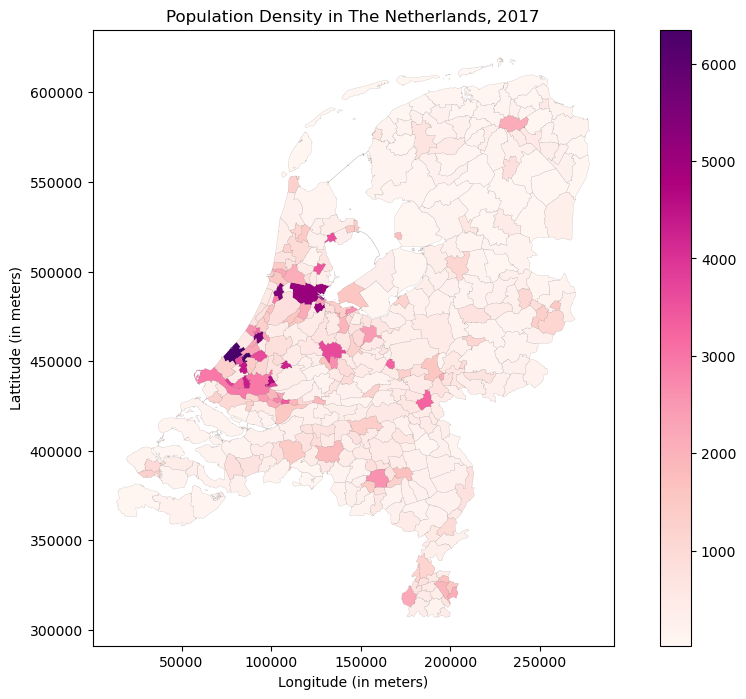

In [25]:
fig, ax = plt.subplots(figsize = (12,8))

gemeentedata.plot(column='bevolkings',edgecolor='black',linewidth=0.05, 
                  legend=True,cmap='RdPu',ax=ax)
ax.set_title("Population Density in The Netherlands, 2017")
ax.set_xlabel('Longitude (in meters)')
ax.set_ylabel('Lattitude (in meters)')

But this actually mainly highlights the largest and most densily populated cities. We do not really see much spatial variation within the remainder of the Netherlands. One way to put less emphasizes on the extremes, would be to use the `vmax` argument. But we will already play around with `vmax` when we create the raster. So let's play around with something else: turn the legend into quantiles. To do so, we can use the `scheme` argument.

Moreover, let's also remove the axis lines, as that will look nicer.

(344.0296500000022, 291214.17734999995, 291224.70168500004, 634913.196615)

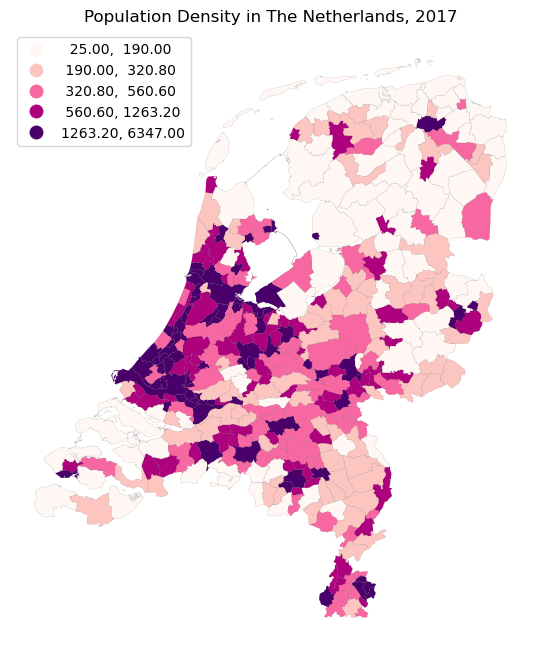

In [26]:
fig, ax = plt.subplots(figsize = (12,8))

gemeentedata.plot(column='bevolkings',edgecolor='black',linewidth=0.05,
                  cmap='RdPu',ax=ax, scheme="quantiles", 
                 legend=True, legend_kwds={'loc': 'upper left'})
ax.set_title("Population Density in The Netherlands, 2017")
plt.axis('off')


But these quantiles look a bit ugly and slightly arbitrary. I am sure you have seen this before when doing some automated categorization in QGIS. Luckily we can simply specify our own bins, by setting the `scheme` argument to *"User_Defined"*. And through the `classification_kwds` argument, we can specify the bins. Moreover, as you may have already gathered in the previous plot, we also set the `legend_kwds` in which we specify the location of the legend within the plot.

(344.0296500000022, 291214.17734999995, 291224.70168500004, 634913.196615)

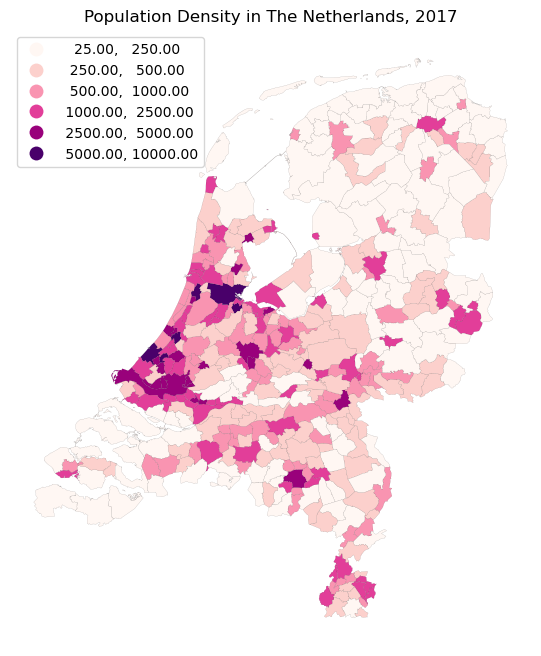

In [27]:
fig, ax = plt.subplots(figsize = (12,8))

gemeentedata.plot(column='bevolkings', 
                  cmap='RdPu',ax=ax, scheme="User_Defined",edgecolor='black',linewidth=0.05,
                 legend=True, classification_kwds=dict(bins=[250,500,1000,2500,5000,10000]),
                                                      legend_kwds={'loc': 'upper left'})
ax.set_title("Population Density in The Netherlands, 2017")
plt.axis('off')


### Raster data

And we can do similar things with raster data, ofcourse. Let's plot a map of population density for Kenya. This data is downloaded from the [WorldPop](www.worldpop.org) website.

We first load the data, using the **rasterio** package.

In [17]:
src = rasterio.open("ken_pd_2020_1km_UNadj.tif")
kenya_pd = src.read(1) 

And let's try to plot this data:

(-0.5, 956.5, 1222.5, -0.5)

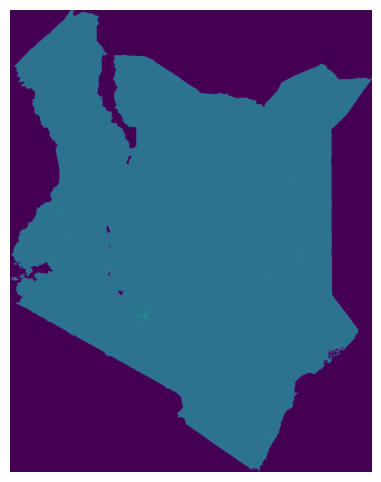

In [18]:
fig, ax = plt.subplots(figsize=(8,6))

ken = ax.imshow(kenya_pd, cmap='viridis')
ax.axis('off')

That does not really tell us anything! It seems we need to do something about the values we plotting. Let's first add a colorbar so we at least know what we are looking at:

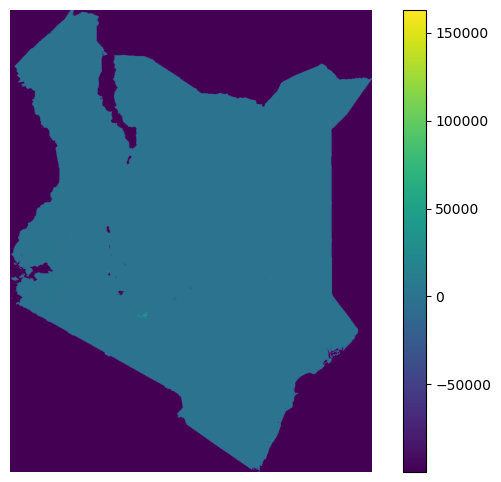

In [19]:
fig, ax = plt.subplots(figsize=(8,6))

ken = ax.imshow(kenya_pd, cmap='viridis')
ax.axis('off')

fig.colorbar(ken,ax=ax)

So it seems we may have quite some extreme values, which remove all the detail. Let's use the `vmin` and `vmax` arguments to see if we can get a better image if we cap the minimum (`vmin`) and maximum (`vmax`) values that we want to visualize.

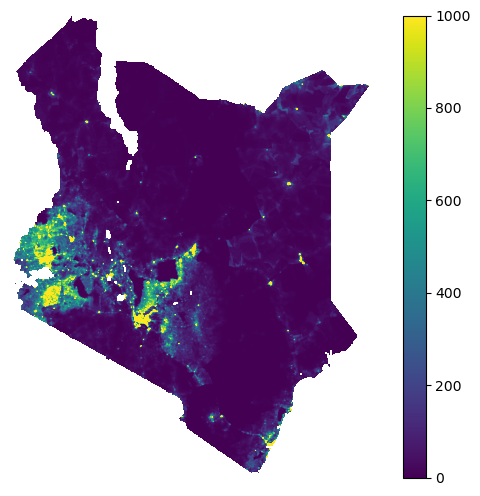

In [23]:
fig, ax = plt.subplots(figsize=(8,6))

ken = ax.imshow(kenya_pd, cmap='viridis',vmin=0,vmax=1000)
ax.axis('off')
fig.colorbar(ken,ax=ax)

That already looks much better, but we seem to have a lot of nodata values around Kenya, which all turn purple as well. They seem to have some large negative value. Let's explore:

In [21]:
kenya_pd.min()

-99999.0

We may want to change this large negative value to actual nodata. To do so, we change all these large negative values into NaN (Not A Number) values. This will make sure that these cells will be ignored when plotted.

In [22]:
kenya_pd = np.where(kenya_pd==kenya_pd.min(), np.nan, kenya_pd)

Now we plot the results again:

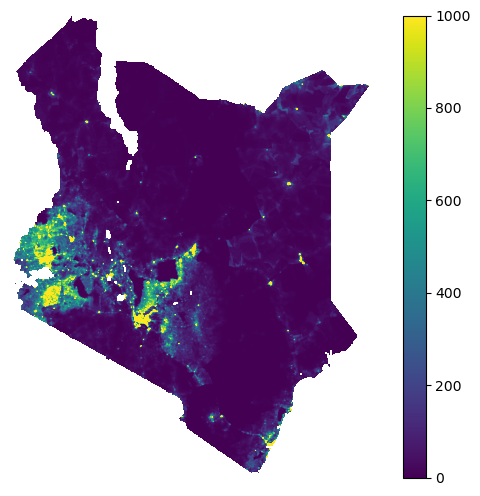

In [27]:
fig, ax = plt.subplots(figsize=(8,6))

ken = ax.imshow(kenya_pd, cmap='viridis',vmin=0,vmax=1000)
ax.axis('off')
fig.colorbar(ken,ax=ax)

Now we need to make sure that we know what we are looking at. So let's add a description of the colorbar values as well. And add a title.

Text(0.5, 1.05, 'Population Density for Kenya in 2020')

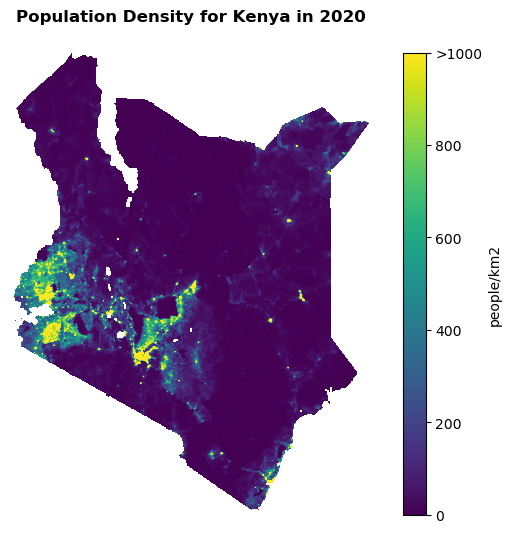

In [28]:
fig, ax = plt.subplots(figsize=(8,6))

ken = ax.imshow(kenya_pd, cmap='viridis',vmin=0,vmax=1000)
ax.axis('off')
cbar=  fig.colorbar(ken,ax=ax)
cbar.set_label('people/km2')
cbar.ax.set_yticks([0,200,400,600,800,1000])  
cbar.ax.set_yticklabels(['0', '200', '400', '600', '800', '>1000'])  

plt.title('Population Density for Kenya in 2020',fontweight='bold',y=1.05)

## 5. Using Plotly for interactive visualization
<hr>

Plotly is an open-source Python graphing library that allows users to create interactive visualizations, such as line charts, scatter plots, bar charts, heatmaps, and more.

The library offers an easy-to-use interface for creating visualizations with a wide range of customization options. Plotly allows users to create interactive plots and charts that can be embedded in web pages, Jupyter notebooks, and other applications.

Let's explore how easy Plotly can be applied through using one of their dummy datasets. 

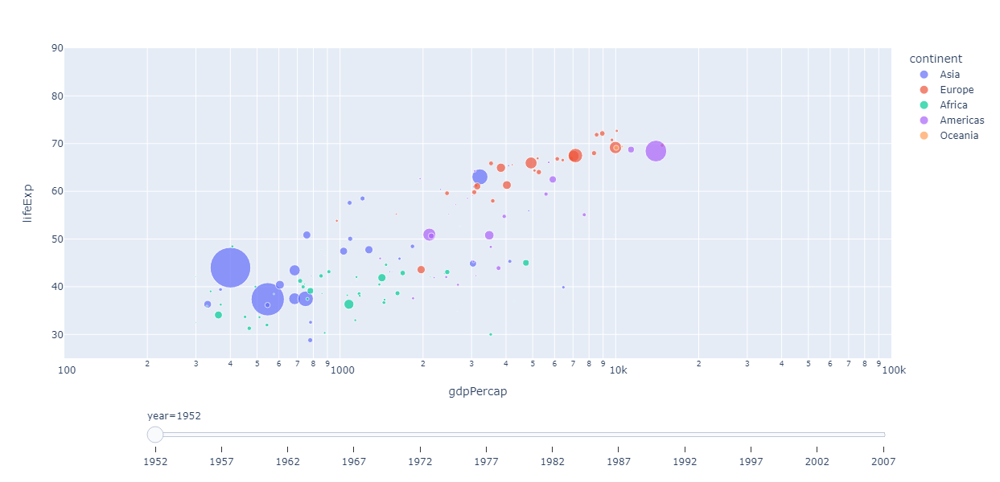

In [37]:
df = px.data.gapminder()
fig = px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90], width=800, height=600)

fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.show()

Now let's try to create such a plot with some CBS data! To do so, we will use Statline data that I have already collected for you. The information we have collected contains a timeserie of data on *population*, *building stock* and the number of *primary school students* within each municipality between 2000 and 2020. The **.csv** file is a direct excerpt from Statline, I did not change anything to the data. 

We start with loading a file that allows us to connect the names of municipalities with each province.

In [38]:
gem_prov = pd.read_excel('Gemeenten alfabetisch 2022.xlsx')[['Gemeentenaam','Provincienaam']]

And now we load the data that I downloaded direct from [Statline](https://opendata.cbs.nl/statline): 

In [39]:
bevolking_gemeente = pd.read_csv('Regionale_kerncijfers_Nederland_17032023_094145.csv',sep=';')
bevolking_gemeente.dropna(inplace=True)

However, the column names are somewhat long and inconvenient to plot, so let's rename those column names:

In [40]:
bevolking_gemeente.columns= ['Year','Gemeente','Population','Building stock','Primary School Students']

And now we merge the Statline information with the dataframe containing municapility and province names.

In [41]:
bevolking_gemeente = bevolking_gemeente.merge(gem_prov,left_on='Gemeente',right_on='Gemeentenaam')

And use the same code as above, but now with our own data:

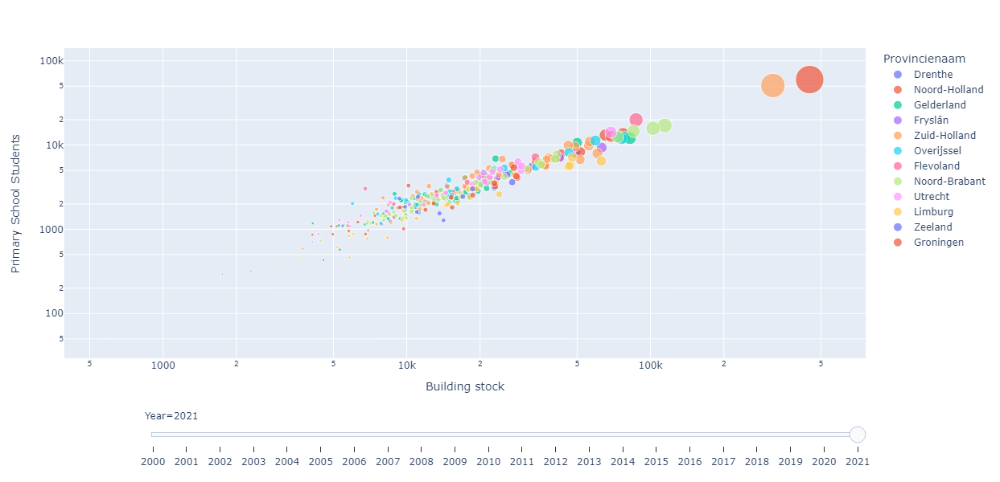

In [42]:
fig = px.scatter(bevolking_gemeente, x="Building stock", y="Primary School Students", animation_frame="Year", 
                 animation_group='Gemeentenaam',
           size='Population',color="Provincienaam", hover_name='Gemeentenaam',
           log_x=True, log_y=True, size_max=25, width=800, height=600)

fig["layout"].pop("updatemenus") 
fig.show()

## 6. Using Folium for interactive spatial visualization
<hr>

Folium is a Python package for creating interactive leaflet maps. It allows users to create different types of maps including scatter plots, choropleth maps, and marker maps. Folium is built on top of the JavaScript leaflet library, which is one of the most widely used open-source libraries for interactive maps.

Folium can work with data from various sources such as GeoJSON files, Pandas data frames, and CSV files. It also provides various customization options such as choosing different tile sets, adding markers, popups, and tooltips to the map.

### Visualizing point data

Let's first play around with creating a Point Cluster map. We do so through the `MarkerCluster` function.

In [43]:
from folium.plugins import MarkerCluster

Let's load some Flickr data we extracted for Ameland:

In [44]:
df = pd.read_csv('Ameland_Flickr.csv')
df = df.dropna()

And quickly make sure that we have the coordinates to be able to plot here. Note (which is a bit confusing) that Folium want that the order of the coordinates is first the latitude (y) and then the longitude (x). Before, we always specified the x-coordinate before the y-coordinate.

In [45]:
df['longitude'] = df['longitude'].astype(float)
df['latitude'] = df['latitude'].astype(float)
df['coordinates'] = [list(x) for x in list(zip(df['latitude'],df['longitude']))]

Let's add a `nature` tag to our data again, so we can visualize which photos are tagged as nature, and which not. 

In [46]:
def find_nature_tags(row):
    matches = ["seehund", "zeehond","vis","wadden",
               "natuur","nature","natur",
               "landschaft",
               "strand","beach","zee","sea","meer",
               "bos","forest",
               "animal","bird","vogel","dier"]

    overlap = set(row.split()).intersection(set(matches))
    
    if len(overlap) :
        return 'yes'
    
df['nature'] = df.tags.apply(lambda x: find_nature_tags(x))

Now we convert the data to plot to a dictioniary, which is easy to read by the Folium algorithm.

In [47]:
data_sites = df[['nature','coordinates']].to_dict(orient='records')

And prepare the map.

In [48]:
map_1 = folium.Map(location=[53.429979, 5.762622])

On the map, we will plot two different feature groups: Photos that are tagged as *Nature* and photos that are **not** tagged as *Nature*.

In [49]:
feature_group_nature = folium.FeatureGroup(name='Nature')
feature_group_nonature = folium.FeatureGroup(name='No Nature')

In [50]:
marker_cluster_nature = MarkerCluster()
marker_cluster_nonature =MarkerCluster()
for site in data_sites:
    if(site["nature"]=="yes"):
        marker_nature = folium.Marker(site["coordinates"],popup="Nature",icon = folium.Icon(color='green',icon='ok-sign'))
        marker_cluster_nature.add_child(marker_nature)
    else:
        marker_nonature = folium.Marker(site["coordinates"],popup="No Nature",icon = folium.Icon(color='red',icon='exclamation-sign'))
        marker_cluster_nonature.add_child(marker_nonature)

In [51]:
feature_group_nature.add_child(marker_cluster_nature)
feature_group_nonature.add_child(marker_cluster_nonature)

In [52]:
map_1.add_child(feature_group_nature)
map_1.add_child(feature_group_nonature)

### Visualizing polygon data

Let's use the municipality data again to show how we can interactively chloropleth maps through Folium.

To make sure it works well with the background maps, we convert the data to a global coordinate reference system again (**EPSG:4326**).

In [60]:
gemeentedata = gemeentedata.to_crs(4326)

To make sure we get tooltips (i.e. pop-ups for each polygon), we will use two important functions for this method:

- **style_function** - A function that will be called for each feature in the GeoJSON data to determine its style. The function should take one argument (the feature) and return a dictionary of style options.
- **highlight_function** - A function that will be called when a feature is clicked. The function should take two arguments (the feature and the layer) and return a dictionary of style options to apply to the highlighted feature.

In [ ]:
colormap = cm.linear.YlOrRd_09.to_step(data=gemeentedata['bevolkings'], n=9, method="linear")
colormap.caption = "Population per km2"

style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['bevolkings']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

Now we can plot the map using the `folium.features.GeoJson` function. As you notice, you see the word **GeoJson**. A GeoJSON object is a data format for storing geographic data in JSON (JavaScript Object Notation) format. It's essentially a way of representing geospatial data using text-based data structures that can be easily read and parsed by computers. A GeoJSON object can be thought of as the underlying data structure that's used to store the geometry information in a GeoPandas DataFrame. When you create a GeoPandas DataFrame, you're essentially creating a pandas DataFrame that includes a geometry column, where each element in that column is a GeoJSON object that contains the spatial information for the corresponding feature.

Let's break down the different arguments of the  `folium.features.GeoJson` that we are using (besides the style and highlight function):

- **data** - This is the GeoJSON data that you want to visualize on the map. It can be a Python dictionary or a JSON string.
- **tooltip** - A string that will be displayed as a tooltip when the mouse is hovered over a feature.
- **control** - A boolean that determines whether the layer should be added to the LayerControl object. If set to False, the layer won't be displayed in the layer control.

In [160]:
mymap = folium.Map(location=[52.10771254281107, 5.4293253455879675], zoom_start=7,tiles=None)

folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(mymap)

NIL=folium.features.GeoJson(
        gemeentedata,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(fields=['statnaam','bevolkings'],
            aliases=['Gemeente','Population Density (people/km2)'],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
            sticky=True
        )
    )
colormap.add_to(mymap)
mymap.add_child(NIL)
mymap